In [ ]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from libs.train.dataframe_splitter import split_dataframe, select_features
from sklearn.model_selection import RandomizedSearchCV

In [3]:
raw_data = pd.read_csv('data/train_set.csv')
target = pd.read_csv('data/target_set.csv')
randomState = 42

x, y = split_dataframe(raw_data, target)
X_new = select_features(x, y, 195)

In [4]:
def make_model(max_depth:None|int = None, min_leaf=1, min_split=2, max_leaf_nodes=None, max_features=None):
	return DecisionTreeClassifier(random_state=randomState, max_depth=max_depth, min_samples_leaf=min_leaf, min_samples_split=min_split, max_leaf_nodes=max_leaf_nodes, max_features=max_features)

def train_model(model:DecisionTreeClassifier, X:pd.DataFrame, y:pd.DataFrame):
	model.fit(X=X, y=y)

def modelTrainCycle(x, y, depth=14, min_leaf=1, min_split=2, max_leaf_nodes=None, max_features=None):
	model = make_model(depth, min_leaf, min_split, max_leaf_nodes, max_features)
	train_model(model, x, y)
	return model

def show_tree(model, x, figsize=None):
	if figsize != None:
		plt.figure(figsize=figsize)
	plot_tree(
		model,
		feature_names=x.columns.tolist(),
		class_names=['Not in 2022', 'In 2022'],
		filled=True,
		rounded=True,
		fontsize=10
	)
	plt.show()

def show_confusion(y, y_pred):
	cm = confusion_matrix(y_true=y, y_pred=y_pred)
	disp = ConfusionMatrixDisplay(confusion_matrix=cm)
	disp.plot()
	plt.show()

def print_accuracy(y, y_pred):
	score = accuracy_score(
		y_true=y,
		y_pred=y_pred
	)
	print(f"accuracy: {score}")

def print_f1score(y, y_pred):
	print(f"f1Score: {get_f1score(y, y_pred)}")

def get_f1score(y, y_pred):
	return f1_score(
		y_true=y,
		y_pred=y_pred
	)

In [ ]:
model = make_model(1)
train_model(model, x.train, y.train)

In [213]:
y_pred = model.predict(X=x.test)
print_accuracy(y.test, y_pred)
print_f1score(y.test, y_pred)

0.903427495291902
0.0


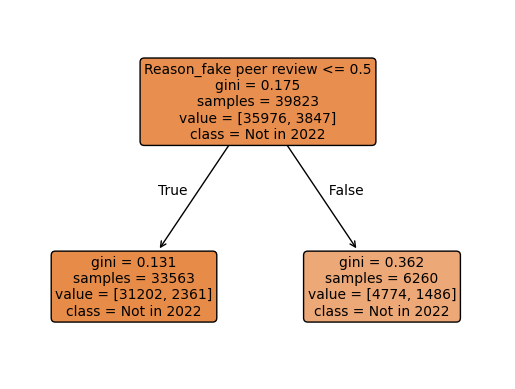

In [214]:
show_tree(model, x.train)

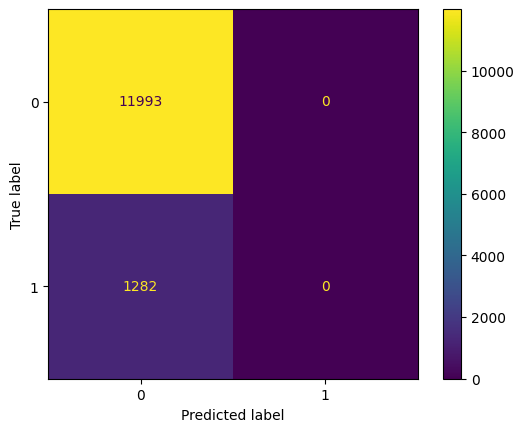

In [215]:
show_confusion(y.test, y_pred)

features: 462
leaves: 380
0.9715793441387109
0.8505747126436781


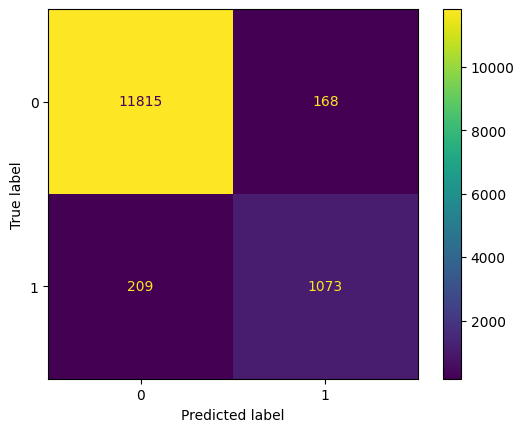

In [222]:
m = modelTrainCycle(x.train, y.train)

y_pred = m.predict(X=x.test)

print(f"features: {m.n_features_in_}")
print(f"leaves: {m.get_n_leaves()}")
print_accuracy(y.test, y_pred)
print_f1score(y.test, y_pred)
# show_tree(m, x.train)
show_confusion(y.test, y_pred)

features: 195
leaves: 252
0.9656238220882021
0.8118811881188119


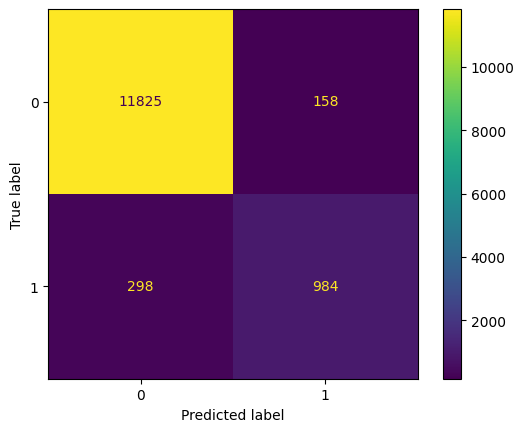

In [ ]:
m2 = modelTrainCycle(X_new.train, y.train, 12)

y_pred = m2.predict(X=X_new.test)

print(f"features: {m2.n_features_in_}")
print(f"leaves: {m2.get_n_leaves()}")
print_accuracy(y.test, y_pred)
print_f1score(y.test, y_pred)
# show_tree(m, x.train)
show_confusion(y.test, y_pred)

In [ ]:
def findBestF1ScoreModel(x, y):
	bestModel = None
	bestF1Score = -1

	f1score = []
		
	m = modelTrainCycle(x, y, None)
	max = m.get_depth()
	print(f"maxdepth: {max}")

	for depth in range(1, max):
		model = modelTrainCycle(x, y, depth)
		
		y_pred = model.predict(X=x.test)
		f1_score = get_f1score(y.test, y_pred)
		f1score.append(f1_score)

		if f1_score > bestF1Score:
			bestModel = model
			bestF1Score = f1_score

	print(f1score)
	return bestModel
bestModel = findBestF1ScoreModel(x, y)


maxdepth: 32
[0.0, 0.3565989847715736, 0.35841836734693877, 0.5210727969348659, 0.5347298787210585, 0.5405105438401776, 0.5621562156215621, 0.689738430583501, 0.7549103330486764, 0.7589562140645731, 0.807448159119763, 0.8340180772391126, 0.8340147179067866, 0.8464696223316913, 0.8528455284552846, 0.858034321372855, 0.8632313056954669, 0.8652427184466019, 0.8675728155339806, 0.8693291973633192, 0.868922598210813, 0.8710059171597633, 0.8815165876777251, 0.8759873617693523, 0.8809523809523809, 0.8822593476531424, 0.8824463860206513, 0.8833531039936734, 0.88, 0.878727634194831, 0.8796844181459567]


In [ ]:
print(f"depth: {bestModel.get_depth()}")
y_final_pred = bestModel.predict(X=x.test)
print_f1score(y.test, y_final_pred)
print_accuracy(y.test, y_final_pred)

depth: 28
0.892515923566879
0.9796610169491525


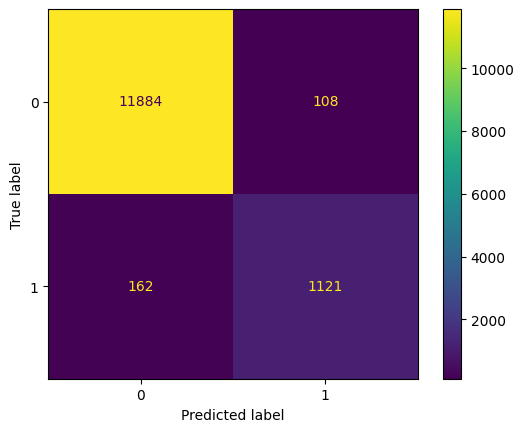

In [ ]:
# show_tree(m, x.test)
show_confusion(y.test, y_final_pred)

depth: 12
f1Score: 0.8133773740710157
accuracy: 0.965925367508481


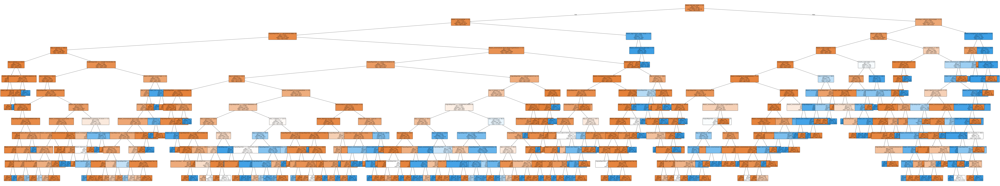

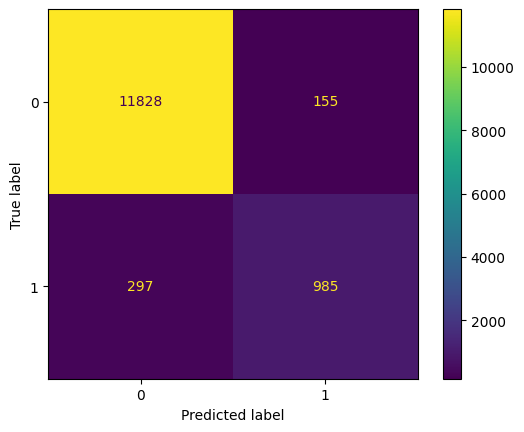

In [342]:
balanced_model = modelTrainCycle(x.train, y.train, 12)
y_balanced_pred = balanced_model.predict(X=x.test)

print(f"depth: {balanced_model.get_depth()}")
print_f1score(y.test, y_balanced_pred)
print_accuracy(y.test, y_balanced_pred)

show_tree(balanced_model, x.test, (160, 30))
show_confusion(y.test, y_balanced_pred)

depth: 12
0.8193288590604026
0.9662004369334304


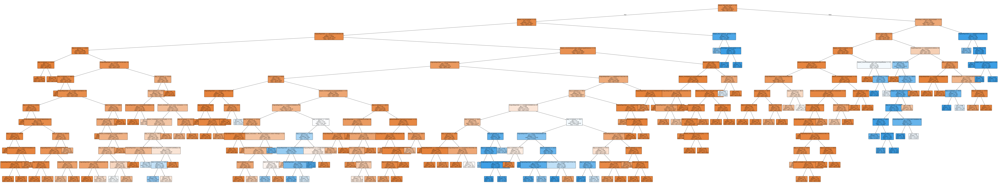

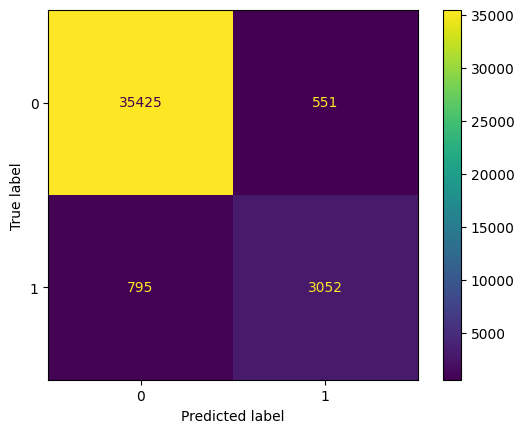

In [ ]:
balanced_model = modelTrainCycle(x, y, 12, 50, 100)
y_balanced_pred = balanced_model.predict(X=x.train)

print(f"depth: {balanced_model.get_depth()}")
print_f1score(y.train, y_balanced_pred)
print_accuracy(y.train, y_balanced_pred)

show_tree(balanced_model, x.train, (160, 30))
show_confusion(y.train, y_balanced_pred)

In [13]:
leafSamplesList =  list(range(15, 50)) + list(range(50, 100, 3)) + list(range(100, 200, 10)) + list(range(200, 400, 20)) + list(range(400, 1000, 100))
splitSamplesList = list(range(20, 50)) + list(range(50, 100, 3)) + list(range(100, 200, 10)) + list(range(200, 400, 20)) + list(range(400, 2000, 100))

param_distributions = {
    'max_depth': [12],
	'min_samples_leaf': leafSamplesList,
	'min_samples_split': splitSamplesList,
	'max_leaf_nodes': range(50, 252),
	'max_features': range(100, 195)
}

randomModel = RandomizedSearchCV(
    DecisionTreeClassifier(random_state=42),
    param_distributions,
    n_iter=500,
    cv=5,
    scoring='f1',
    n_jobs=-1,
    random_state=42
)

randomModel.fit(X=X_new.train, y=y.train)

,estimator,DecisionTreeC...ndom_state=42)
,param_distributions,"{'max_depth': [12], 'max_features': range(100, 195), 'max_leaf_nodes': range(50, 252), 'min_samples_leaf': [15, 16, ...], ...}"
,n_iter,500
,scoring,'f1'
,n_jobs,-1
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,random_state,42
,error_score,nan


In [11]:
def print_randomSearch(randomModel, X_new, y):
	print(f"Beste parameters gevonden: {randomModel.best_params_}")
	print(f"bestF1Score: {randomModel.best_score_}")

	depth = randomModel.best_params_['max_depth']
	min_leaf = randomModel.best_params_['min_samples_leaf']
	min_split = randomModel.best_params_['min_samples_split']
	leaves = randomModel.best_params_['max_leaf_nodes']
	features = randomModel.best_params_['max_features']

	final_model = modelTrainCycle(X_new.train, y.train, depth, min_leaf, min_split, leaves, features)
	y_final_pred = final_model.predict(X=X_new.test)

	print(f"leaves: {final_model.get_n_leaves()}")
	print(f"depth: {final_model.get_depth()}")
	print_f1score(y.test, y_final_pred)
	print_accuracy(y.test, y_final_pred)

	show_tree(final_model, X_new.test, (160, 30))
	show_confusion(y.test, y_final_pred)

Beste parameters gevonden: {'min_samples_split': 22, 'min_samples_leaf': 15, 'max_leaf_nodes': 198, 'max_features': 186, 'max_depth': 12}
bestF1Score: 0.7932746458436528
leaves: 198
depth: 12
f1Score: 0.795653990806519
accuracy: 0.9631360723709008


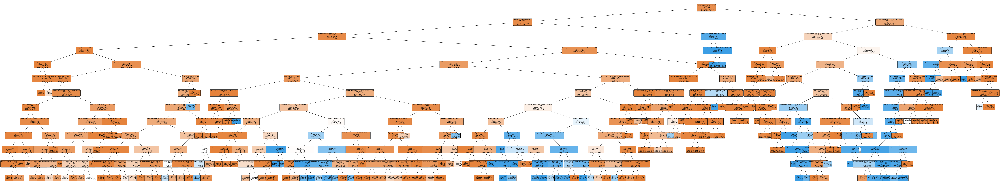

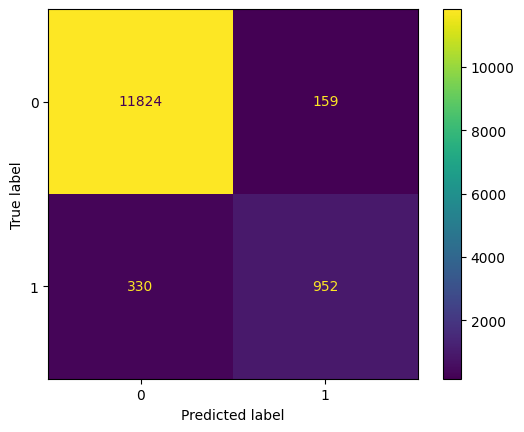

In [14]:
print_randomSearch(randomModel, X_new, y)

In [16]:
leafSamplesList =  list(range(10, 30))
splitSamplesList = list(range(10, 40))

param_distributions = {
    'max_depth': [9],
	'min_samples_leaf': leafSamplesList,
	'min_samples_split': splitSamplesList,
	'max_leaf_nodes': range(60, 85),
	'max_features': range(150, 175)
}

randomModel2 = RandomizedSearchCV(
    DecisionTreeClassifier(random_state=42),
    param_distributions,
    n_iter=1500,
    cv=2,
    scoring='f1',
    n_jobs=-1,
    random_state=42
)


randomModel2.fit(X=X_new.train, y=y.train)

,estimator,DecisionTreeC...ndom_state=42)
,param_distributions,"{'max_depth': [9], 'max_features': range(150, 175), 'max_leaf_nodes': range(60, 85), 'min_samples_leaf': [10, 11, ...], ...}"
,n_iter,1500
,scoring,'f1'
,n_jobs,-1
,refit,True
,cv,2
,verbose,0
,pre_dispatch,'2*n_jobs'
,random_state,42
,error_score,nan


Beste parameters gevonden: {'min_samples_split': 10, 'min_samples_leaf': 13, 'max_leaf_nodes': 71, 'max_features': 154, 'max_depth': 9}
bestF1Score: 0.7266873154335463
leaves: 71
depth: 9
f1Score: 0.6536185707783341
accuracy: 0.9426309837919337


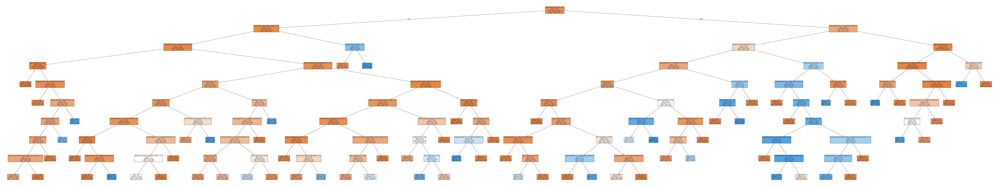

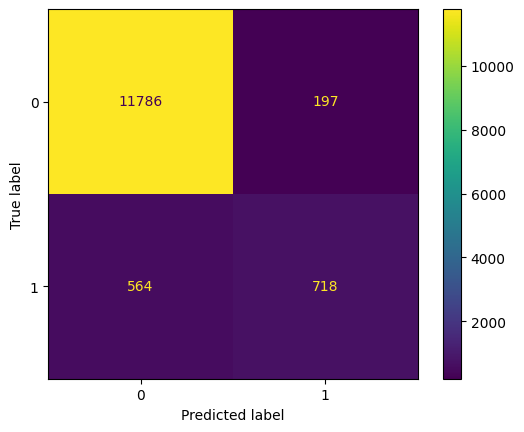

In [17]:
print_randomSearch(randomModel2, X_new, y)

leaves: 66
depth: 9
f1Score: 0.671900826446281
accuracy: 0.9401432340746325


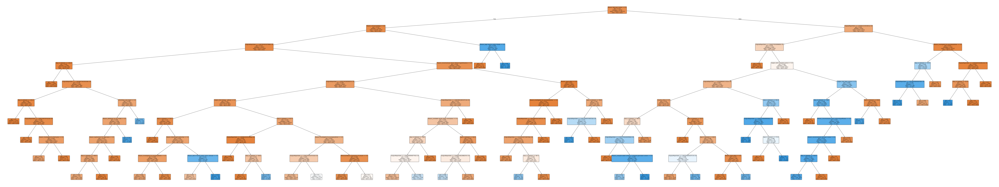

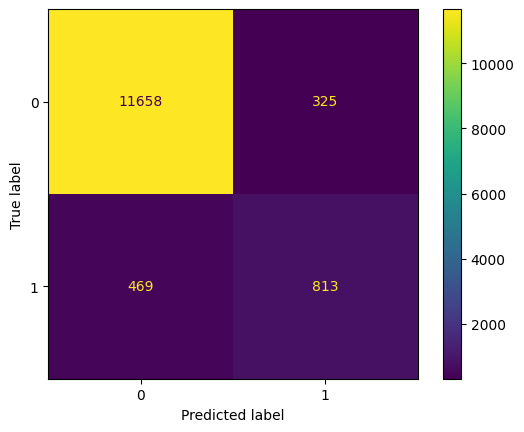

In [ ]:
final_model3 = modelTrainCycle(X_new.train, y.train, 9, 13, 11, 66, 161)
y_final_pred3 = final_model3.predict(X=X_new.test)

print(f"leaves: {final_model3.get_n_leaves()}")
print(f"depth: {final_model3.get_depth()}")
print_f1score(y.test, y_final_pred3)
print_accuracy(y.test, y_final_pred3)

show_tree(final_model3, X_new.test, (160, 30))
show_confusion(y.test, y_final_pred3)

In [ ]:
leafSamplesList =  list(range(10, 30))
splitSamplesList = list(range(10, 40))

param_distributions = {
    'max_depth': [9],
	'min_samples_leaf': leafSamplesList,
	'min_samples_split': splitSamplesList,
	'max_leaf_nodes': range(60, 85),
	'max_features': range(150, 175)
}

randomModel3 = RandomizedSearchCV(
    DecisionTreeClassifier(random_state=42),
    param_distributions,
    n_iter=6000,
    cv=10,
    scoring='f1',
    n_jobs=-1,
    random_state=42
)


randomModel3.fit(X=X_new.train, y=y.train)

In [ ]:
depth = randomModel3.best_params_['max_depth']
min_leaf = randomModel3.best_params_['min_samples_leaf']
min_split = randomModel3.best_params_['min_samples_split']
leaves = randomModel3.best_params_['max_leaf_nodes']
features = randomModel3.best_params_['max_features']

validation_model = modelTrainCycle(X_new.train, y.train, depth, min_leaf, min_split, leaves, features)
val_pred = validation_model.predict(X=X_new.val)

print(f"leaves: {validation_model.get_n_leaves()}")
print(f"depth: {validation_model.get_depth()}")
print_f1score(y.test, val_pred)
print_accuracy(y.test, val_pred)

show_tree(validation_model, X_new.val, (160, 30))
show_confusion(y.test, val_pred)

# randomModel